<a href="https://colab.research.google.com/github/Anil1331/Deep-Learning-in-Computer-Vision/blob/master/Gan_task.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
# Original Version: Taehoon Kim (http://carpedm20.github.io)
#   + Source: https://github.com/carpedm20/DCGAN-tensorflow/blob/e30539fb5e20d5a0fed40935853da97e9e55eee8/ops.py
#   + License: MIT

import math
import numpy as np
import tensorflow as tf

class batch_norm(object):
    """Code modification of http://stackoverflow.com/a/33950177"""
    def __init__(self, epsilon=1e-5, momentum = 0.9, name="batch_norm"):
        with tf.variable_scope(name):
            self.epsilon = epsilon
            self.momentum = momentum

            self.name = name

    def __call__(self, x, train=True):
        return tf.contrib.layers.batch_norm(x, decay=self.momentum, updates_collections=None, epsilon=self.epsilon,
                                            center=True, scale=True, is_training=train, scope=self.name)

def conv2d(input_, output_dim,
           k_h=5, k_w=5, d_h=2, d_w=2, stddev=0.02,
           name="conv2d"):
    with tf.variable_scope(name):
        w = tf.get_variable('w', [k_h, k_w, input_.get_shape()[-1], output_dim],
                            initializer=tf.truncated_normal_initializer(stddev=stddev))
        conv = tf.nn.conv2d(input_, w, strides=[1, d_h, d_w, 1], padding='SAME')

        biases = tf.get_variable('biases', [output_dim], initializer=tf.constant_initializer(0.0))
        # conv = tf.reshape(tf.nn.bias_add(conv, biases), conv.get_shape())
        conv = tf.nn.bias_add(conv, biases)

        return conv

def lrelu(x, leak=0.2, name="lrelu"):
    with tf.variable_scope(name):
        f1 = 0.5 * (1 + leak)
        f2 = 0.5 * (1 - leak)
        return f1 * x + f2 * abs(x)
    
def deconv2d(input_, output_shape, k_h=5, k_w=5, d_h=2, d_w=2, stddev=0.02,
       name="deconv2d", with_w=False):
    with tf.variable_scope(name):
        # filter : [height, width, output_channels, in_channels]
        w = tf.get_variable('w', [k_h, k_w, output_shape[-1], input_.get_shape()[-1]],
                  initializer=tf.random_normal_initializer(stddev=stddev))

        try:
            deconv = tf.nn.conv2d_transpose(input_, w, output_shape=output_shape,
                    strides=[1, d_h, d_w, 1])

        # Support for verisons of TensorFlow before 0.7.0
        except AttributeError:
            deconv = tf.nn.deconv2d(input_, w, output_shape=output_shape,
                    strides=[1, d_h, d_w, 1])

        biases = tf.get_variable('biases', [output_shape[-1]], initializer=tf.constant_initializer(0.0))
        deconv = tf.reshape(tf.nn.bias_add(deconv, biases), deconv.get_shape())

        if with_w:
            return deconv, w, biases
        else:
            return deconv

def linear(input_, output_size, scope=None, stddev=0.02, bias_start=0.0, with_w=False):
    shape = input_.get_shape().as_list()

    with tf.variable_scope(scope or "Linear"):
        matrix = tf.get_variable("Matrix", [shape[1], output_size], tf.float32,
                                 tf.random_normal_initializer(stddev=stddev))
        bias = tf.get_variable("bias", [output_size],
            initializer=tf.constant_initializer(bias_start))
        if with_w:
            return tf.matmul(input_, matrix) + bias, matrix, bias
        else:
            return tf.matmul(input_, matrix) + bias

In [0]:
# Original Version: Taehoon Kim (http://carpedm20.github.io)
#   + Source: https://github.com/carpedm20/DCGAN-tensorflow/blob/e30539fb5e20d5a0fed40935853da97e9e55eee8/utils.py
#   + License: MIT
from __future__ import division
import math
import random
import scipy.misc
import numpy as np
import cv2

def get_image(image_path, image_size, is_crop=True):
    return transform(imread(image_path), image_size, is_crop)

def save_images(images, size, image_path):
    return imsave(inverse_transform(images), size, image_path)

def imread(path):
    return scipy.misc.imread(path).astype(np.float)

def merge_images(images, size):
    return inverse_transform(images)

def merge(images, size):
    h, w = images.shape[1], images.shape[2]
    img = np.zeros((int(h * size[0]), int(w * size[1]), 3))
    for idx, image in enumerate(images):
        i = idx % size[1]
        j = idx // size[1]
        img[j*h:j*h+h, i*w:i*w+w, :] = image
    return img

def imsave(images, size, path):
    img = merge(images, size)
    return scipy.misc.imsave(path, (255*img).astype(np.uint8))

def center_crop(x, crop_h, crop_w=None):
    # The original images are 218*178. If I crop directly 64*64 at the center, I will probably get only
    # a small part of a face, and the result won't be good. So I crop 128*128, and I resize at 64*64
    if crop_w is None:
        crop_w = crop_h
    h, w = x.shape[:2]
    j = h//2 - crop_h
    i = w//2 - crop_w
    result = cv2.resize(x[j:j+crop_h*2, i:i+crop_w*2], (crop_h, crop_w))
    return result  
  
def transform(image, npx=64, is_crop=True):
    if is_crop:
        cropped_image = center_crop(image, npx)
    else:
        cropped_image = image
    return np.array(cropped_image)/127.5 - 1.  
  
def inverse_transform(images):
    return (images+1.)/2.

In [0]:
from __future__ import division
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from glob import glob
import time
import os

In [0]:
import requests

def download_file_from_google_drive(id, destination):
    def get_confirm_token(response):
        for key, value in response.cookies.items():
            if key.startswith('download_warning'):
                return value

        return None

    def save_response_content(response, destination):
        CHUNK_SIZE = 32768

        with open(destination, "wb") as f:
            for chunk in response.iter_content(CHUNK_SIZE):
                if chunk: # filter out keep-alive new chunks
                    f.write(chunk)

    URL = "https://docs.google.com/uc?export=download"

    session = requests.Session()

    response = session.get(URL, params = { 'id' : id }, stream = True)
    token = get_confirm_token(response)

    if token:
        params = { 'id' : id, 'confirm' : token }
        response = session.get(URL, params = params, stream = True)

    save_response_content(response, destination)


# TAKE ID FROM SHAREABLE LINK
file_id = "0B7EVK8r0v71pZjFTYXZWM3FlRnM"
# DESTINATION FILE ON YOUR DISK
destination = "celebA.zip"
download_file_from_google_drive(file_id, destination)

In [0]:
!unzip -qq celebA.zip

In [0]:
DATA_PATH = 'img_align_celeba/' # Path to the dataset with celebA faces
Z_DIM=100 # Dimension of face's manifold
GENERATOR_DENSE_SIZE=64*8 # Length of first tensor in generator

IMAGE_SIZE=64 # Shapes of input image
BATCH_SIZE=512 # Batch size
N_CHANNELS = 3 # Number channels of input image

MERGE_X = 64 # Number images in merged image

In [0]:
def generator(z, is_training):
    # Firstly let's reshape input vector into 3-d tensor. 
    z_ = linear(z, GENERATOR_DENSE_SIZE * 4 * 4, 'g_h0_lin')
    h_in = tf.reshape(z_, [-1, 4, 4, GENERATOR_DENSE_SIZE])
    
    """
        Your code goes here.
    """    
    bnorm0 = batch_norm(name='g_b_norm_0')
    block = bnorm0(h_in, is_training)
    block = lrelu(block, name='g_relu_0')
    
    block = deconv2d(block, output_shape=[BATCH_SIZE, 8, 8, 512], name='deconv2d_1')
    bnorm1 = batch_norm(name='g_b_norm_1')
    block = bnorm1(block, is_training)
    block = lrelu(block, name='g_relu_1')
    block = tf.nn.dropout(block, 0.5, name='dropout1')
    
    block = deconv2d(block, output_shape=[BATCH_SIZE, 16, 16, 256], name='deconv2d_2')
    bnorm2 = batch_norm(name='g_b_norm_2')
    block = g_batch_norm_2(block, is_training)
    block = lrelu(block, name='g_relu_2')
    dropout2 = tf.nn.dropout(block, 0.5, name='dropout2')
    
    block = deconv2d(block, output_shape=[BATCH_SIZE, 32, 32, 128], name='deconv2d_3')
    block = batch_norm(name='g_b_norm_3')
    block = g_batch_norm_3(block, is_training)
    block = lrelu(block, name='g_relu_3')  
    
    h_out = deconv2d(block, [BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, N_CHANNELS], name='g_out')

    return tf.nn.tanh(h_out)


In [0]:
def discriminator(image, is_training, batch_norms=None):
    """
        Your code goes here.
    """
    block = conv2d(image, output_dim=32, name='d_conv2d_0')
    bnorm0 = batch_norm(name='d_b_norm_0')
    block = bnorm0(block, is_training)
    block = lrelu(block, name='d_relu_0')
    block = tf.layers.average_pooling2d(block, pool_size=(2, 2), strides=2, name='d_pool_0')
    
    block = conv2d(block, output_dim=64, name='d_conv2d_1')
    bnorm1 = batch_norm(name='d_b_norm_1')
    block = bnorm1(block, is_training)
    block = lrelu(block, name='d_relu_1')
    block = tf.layers.average_pooling2d(block, pool_size=(2, 2), strides=2, name='d_pool_1')
    
    block = conv2d(block, output_dim=128, name='d_conv2d_2')
    bnorm2 = batch_norm(name='d_b_norm_2')
    block = bnorm2(h_2, is_training)
    block = lrelu(block, name='d_relu_2')
    block = tf.layers.average_pooling2d(block, pool_size=(2, 2), strides=2, name='d_pool_2')
    
    block = tf.layers.flatten(block)
    block = linear(block, 256, 'd_linear')
    block = lrelu(block, name='d_relu_3')
    
    linear_out = linear(block, 1, 'linear_out')
    
    return tf.nn.sigmoid(linear_out), linear_out

In [10]:
tf.reset_default_graph()
is_training = tf.placeholder(tf.bool, name='is_training')

with tf.variable_scope("G") as scope:
    z = tf.placeholder(tf.float32, [None, Z_DIM], name='z')
    G = generator(z, is_training)

with tf.variable_scope('D') as scope:
    images = tf.placeholder(tf.float32, shape=[None, IMAGE_SIZE, IMAGE_SIZE, N_CHANNELS])
    
    # If you use batch norms from ops define them here (like batch_norms = [batch_norm(name='d_bn0')])
    # and pass to discriminator function instances.
    D_real, D_real_logits = discriminator(images, is_training)
    scope.reuse_variables()
    D_fake, D_fake_logits = discriminator(G, is_training)

Instructions for updating:
Colocations handled automatically by placer.

For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
If you depend on functionality not listed there, please file an issue.

Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
Use keras.layers.average_pooling2d instead.
Instructions for updating:
Use keras.layers.flatten instead.


In [0]:
"""
        You code goes here. Define discriminator and generator losses
"""
d_loss_real = -tf.reduce_mean(tf.log(D_real + 1e-30))

d_loss_fake = -tf.reduce_mean(tf.log(1 - D_fake + 1e-30))

d_loss = d_loss_real + d_loss_fake

g_loss = -tf.reduce_mean(tf.log(D_fake + 1e-30))

In [0]:
tvars = tf.trainable_variables()
## All variables of discriminator
d_vars = [v for v in tvars if 'd_' in v.name]

## All variables of generator
g_vars = [v for v in tvars if 'g_' in v.name]

LEARNING_RATE = 0.0002 # Learning rate for adam optimizer
BETA = 0.5 # Beta paramater in adam optimizer

##Optimizers - ypu may use your favourite instead.
d_optim = tf.train.AdamOptimizer(LEARNING_RATE, beta1=BETA) \
                  .minimize(d_loss, var_list=d_vars)
g_optim = tf.train.AdamOptimizer(LEARNING_RATE, beta1=BETA) \
                  .minimize(g_loss, var_list=g_vars)

In [0]:
data = glob(os.path.join(DATA_PATH, "*.jpg"))
assert(len(data) > 0), "Length of training data should be more than zero"

In [0]:
def load(sess, load_dir):
    """load network's paramaters
    
    load_dir : path to load dir
    """
    saver = tf.train.Saver()
    ckpt = tf.train.get_checkpoint_state(load_dir)
    if ckpt and ckpt.model_checkpoint_path:
        saver.restore(sess, ckpt.model_checkpoint_path)

In [0]:
def train(sess, load_dir=None, save_frequency=100, sample_frequency=100, sample_dir='sample_faces',
          save_dir='checkpoint', max_to_keep=1, model_name='dcgan.model',
          n_epochs=25, n_generator_update=2):
    """train gan
    Parameters
    -------------------------------------------
    load_dir : str, default = None
        path to the folder with parameters
    save_frequency: int, default = 100
        how often save parameters []
    sample_frequency: int, default = None (not sample)
        how often sample faces
    sample_dir: str, default = samples
        directory for sampled images
    save_dir: str, default = 'checkpoint'
        path where to save parameters
    max_to_keep: int, default = 1
        how many last checkpoints to store
    model_name: str, default='dcgan.model'
        name of model
    n_epochs: int, default = 25 
        number epochs to train
    n_generator_update: int, default = 2
        how many times run generator updates per one discriminator update
    -------------------------------------------
    """
    
    if save_frequency is not None:
        saver = tf.train.Saver(max_to_keep=max_to_keep)
        
    if load_dir is not None:
        print("Reading checkpoints...")
        load(sess, load_dir)
        print("Loaded checkpoints")
    else:
        try:
            tf.global_variables_initializer().run()
        except:
            tf.initialize_all_variables().run()

    counter=1
    start_time = time.time()
    
    for epoch in range(n_epochs):
        batch_idxs = min(len(data), np.inf) // BATCH_SIZE
        for idx in range(batch_idxs):
            batch_files = data[idx*BATCH_SIZE:(idx+1)*BATCH_SIZE]
            batch = [get_image(batch_file, IMAGE_SIZE) for batch_file in batch_files]
            batch_images = np.array(batch).astype(np.float32)
            batch_z = np.random.uniform(-1, 1, [BATCH_SIZE, Z_DIM]).astype(np.float32)

            # Update D network
            sess.run(d_optim, feed_dict={images: batch_images, z: batch_z,is_training: True})

            # Update G network
            for _ in range(n_generator_update):
                sess.run(g_optim,
                    feed_dict={z: batch_z, is_training: True})

            errD_fake = d_loss_fake.eval({z: batch_z, is_training: False})
            errD_real = d_loss_real.eval({images: batch_images, is_training: False})
            errG = g_loss.eval({z: batch_z, is_training: False})

            counter += 1
            print("Epoch: [{:2d}] [{:4d}/{:4d}] time: {:4.4f}, d_loss: {:.8f}, g_loss: {:.8f}".format(
                epoch, idx, batch_idxs, time.time() - start_time, errD_fake+errD_real, errG))

            if np.mod(counter, save_frequency) == 1:
                print("Saved model")
                saver.save(sess, 
                           os.path.join(save_dir, model_name))

            if np.mod(counter, sample_frequency) == 1:
                samples = sess.run(G, feed_dict={z: batch_z, is_training: False})
                save_images(samples, [MERGE_X, MERGE_X],
                            os.path.join(sample_dir, 'train_{:02d}_{:04d}.png'.format(epoch, idx)))
                print("Sample")

In [0]:
init_op = tf.initialize_all_variables()
with tf.Session() as sess:
    sess.run(init_op)
    train(sess, save_dir='drive/My Drive/checkpoint', load_dir='drive/My Drive/checkpoint')

Reading checkpoints...
Loaded checkpoints


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  from ipykernel import kernelapp as app


Epoch: [ 0] [   0/ 395] time: 17.0728, d_loss: 1.38633442, g_loss: 0.69350839
Epoch: [ 0] [   1/ 395] time: 23.8847, d_loss: 1.38646817, g_loss: 0.69369888
Epoch: [ 0] [   2/ 395] time: 30.6981, d_loss: 1.38672483, g_loss: 0.69390464
Epoch: [ 0] [   3/ 395] time: 37.5029, d_loss: 1.38679624, g_loss: 0.69443035
Epoch: [ 0] [   4/ 395] time: 44.3190, d_loss: 1.38624787, g_loss: 0.69531566
Epoch: [ 0] [   5/ 395] time: 51.1527, d_loss: 1.38402128, g_loss: 0.69646579
Epoch: [ 0] [   6/ 395] time: 57.9896, d_loss: 1.37973785, g_loss: 0.69744533
Epoch: [ 0] [   7/ 395] time: 64.7874, d_loss: 1.37884331, g_loss: 0.69629002
Epoch: [ 0] [   8/ 395] time: 71.6098, d_loss: 1.37710977, g_loss: 0.69603664
Epoch: [ 0] [   9/ 395] time: 78.4325, d_loss: 1.37770998, g_loss: 0.69845825
Epoch: [ 0] [  10/ 395] time: 85.2567, d_loss: 1.38327289, g_loss: 0.70187724
Epoch: [ 0] [  11/ 395] time: 92.1003, d_loss: 1.38180947, g_loss: 0.71108049
Epoch: [ 0] [  12/ 395] time: 98.9537, d_loss: 1.37332630, g_los

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: DeprecationWarning: `imsave` is deprecated!
`imsave` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imwrite`` instead.


Sample
Epoch: [ 0] [ 100/ 395] time: 705.3976, d_loss: 1.38653529, g_loss: 0.68817043
Epoch: [ 0] [ 101/ 395] time: 712.4694, d_loss: 1.38493204, g_loss: 0.69457614
Epoch: [ 0] [ 102/ 395] time: 719.5824, d_loss: 1.38297987, g_loss: 0.70237952
Epoch: [ 0] [ 103/ 395] time: 726.6628, d_loss: 1.37727857, g_loss: 0.71061200
Epoch: [ 0] [ 104/ 395] time: 733.7050, d_loss: 1.37188196, g_loss: 0.71472329
Epoch: [ 0] [ 105/ 395] time: 740.7269, d_loss: 1.37070286, g_loss: 0.70952427
Epoch: [ 0] [ 106/ 395] time: 747.7456, d_loss: 1.37562537, g_loss: 0.70234400
Epoch: [ 0] [ 107/ 395] time: 754.7744, d_loss: 1.37211061, g_loss: 0.70202249
Epoch: [ 0] [ 108/ 395] time: 761.8002, d_loss: 1.37050509, g_loss: 0.70145619
Epoch: [ 0] [ 109/ 395] time: 768.8367, d_loss: 1.37657118, g_loss: 0.69426191
Epoch: [ 0] [ 110/ 395] time: 775.8499, d_loss: 1.38295197, g_loss: 0.68961692
Epoch: [ 0] [ 111/ 395] time: 782.8569, d_loss: 1.38771462, g_loss: 0.68648952
Epoch: [ 0] [ 112/ 395] time: 789.8818, d_los

In [0]:
!mkdir sample_faces

In [0]:
init_op = tf.initialize_all_variables()
with tf.Session() as sess:
    sess.run(init_op)
    train(sess, save_dir='drive/My Drive/checkpoint', load_dir='drive/My Drive/checkpoint', n_epochs=15)

Reading checkpoints...
INFO:tensorflow:Restoring parameters from drive/My Drive/checkpoint/dcgan.model
Loaded checkpoints


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  from ipykernel import kernelapp as app


Epoch: [ 0] [   0/ 395] time: 17.7802, d_loss: 1.31079078, g_loss: 0.77733755
Epoch: [ 0] [   1/ 395] time: 24.4408, d_loss: 1.29710281, g_loss: 0.72597790
Epoch: [ 0] [   2/ 395] time: 31.0956, d_loss: 1.31922531, g_loss: 0.74892712
Epoch: [ 0] [   3/ 395] time: 37.7981, d_loss: 1.35292697, g_loss: 0.89208233
Epoch: [ 0] [   4/ 395] time: 44.5195, d_loss: 1.31847501, g_loss: 0.81679058
Epoch: [ 0] [   5/ 395] time: 51.2039, d_loss: 1.34676766, g_loss: 0.83100843
Epoch: [ 0] [   6/ 395] time: 57.8762, d_loss: 1.32772374, g_loss: 0.84349358
Epoch: [ 0] [   7/ 395] time: 64.5693, d_loss: 1.31754839, g_loss: 0.72630656
Epoch: [ 0] [   8/ 395] time: 71.3078, d_loss: 1.32331777, g_loss: 0.82112896
Epoch: [ 0] [   9/ 395] time: 78.0500, d_loss: 1.32105088, g_loss: 0.70958364
Epoch: [ 0] [  10/ 395] time: 84.7724, d_loss: 1.29487193, g_loss: 0.79671365
Epoch: [ 0] [  11/ 395] time: 91.5082, d_loss: 1.29970229, g_loss: 0.68717283
Epoch: [ 0] [  12/ 395] time: 98.2455, d_loss: 1.31269658, g_los

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: DeprecationWarning: `imsave` is deprecated!
`imsave` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imwrite`` instead.


Sample
Epoch: [ 0] [ 100/ 395] time: 696.4285, d_loss: 1.31641936, g_loss: 0.80954176
Epoch: [ 0] [ 101/ 395] time: 703.6144, d_loss: 1.34628725, g_loss: 0.80702001
Epoch: [ 0] [ 102/ 395] time: 710.6320, d_loss: 1.30968904, g_loss: 0.88644946
Epoch: [ 0] [ 103/ 395] time: 717.6629, d_loss: 1.33442068, g_loss: 0.72231895
Epoch: [ 0] [ 104/ 395] time: 724.7193, d_loss: 1.31348515, g_loss: 0.76894057
Epoch: [ 0] [ 105/ 395] time: 731.7235, d_loss: 1.33529043, g_loss: 0.81024659
Epoch: [ 0] [ 106/ 395] time: 738.7137, d_loss: 1.34809661, g_loss: 0.67148018
Epoch: [ 0] [ 107/ 395] time: 745.6945, d_loss: 1.34030437, g_loss: 0.64675564
Epoch: [ 0] [ 108/ 395] time: 752.7244, d_loss: 1.34283137, g_loss: 0.84268659
Epoch: [ 0] [ 109/ 395] time: 759.7437, d_loss: 1.30246401, g_loss: 0.79849613
Epoch: [ 0] [ 110/ 395] time: 766.7312, d_loss: 1.29961753, g_loss: 0.77874386
Epoch: [ 0] [ 111/ 395] time: 773.6879, d_loss: 1.33795857, g_loss: 0.86410868
Epoch: [ 0] [ 112/ 395] time: 780.7148, d_los

In [0]:
init_op = tf.initialize_all_variables()
with tf.Session() as sess:
    sess.run(init_op)
    train(sess, save_dir='drive/My Drive/checkpoint', load_dir='drive/My Drive/checkpoint', n_epochs=1)

Reading checkpoints...
Instructions for updating:
Use standard file APIs to check for files with this prefix.
INFO:tensorflow:Restoring parameters from drive/My Drive/checkpoint/dcgan.model
Loaded checkpoints


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  from ipykernel import kernelapp as app


Epoch: [ 0] [   0/ 395] time: 35.2399, d_loss: 1.31580162, g_loss: 0.72205263
Epoch: [ 0] [   1/ 395] time: 42.3525, d_loss: 1.30170107, g_loss: 0.65770185
Epoch: [ 0] [   2/ 395] time: 49.5137, d_loss: 1.33507442, g_loss: 0.94543248
Epoch: [ 0] [   3/ 395] time: 56.6569, d_loss: 1.30701685, g_loss: 0.78963983
Epoch: [ 0] [   4/ 395] time: 63.7947, d_loss: 1.32031035, g_loss: 0.61506605
Epoch: [ 0] [   5/ 395] time: 70.8926, d_loss: 1.30321503, g_loss: 0.68088472
Epoch: [ 0] [   6/ 395] time: 78.0391, d_loss: 1.25729871, g_loss: 0.91196221
Epoch: [ 0] [   7/ 395] time: 85.1486, d_loss: 1.28771007, g_loss: 0.89551848
Epoch: [ 0] [   8/ 395] time: 92.2949, d_loss: 1.24778867, g_loss: 0.84937048
Epoch: [ 0] [   9/ 395] time: 99.3993, d_loss: 1.27517617, g_loss: 0.82838351
Epoch: [ 0] [  10/ 395] time: 106.5456, d_loss: 1.28894532, g_loss: 1.01596701
Epoch: [ 0] [  11/ 395] time: 113.6590, d_loss: 1.28705645, g_loss: 0.84783316
Epoch: [ 0] [  12/ 395] time: 120.7959, d_loss: 1.28127933, g_

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: DeprecationWarning: `imsave` is deprecated!
`imsave` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imwrite`` instead.


Sample
Epoch: [ 0] [ 100/ 395] time: 754.3465, d_loss: 1.29813635, g_loss: 0.93843836
Epoch: [ 0] [ 101/ 395] time: 761.5577, d_loss: 1.32587099, g_loss: 0.92287040
Epoch: [ 0] [ 102/ 395] time: 768.6831, d_loss: 1.39036083, g_loss: 1.06352711
Epoch: [ 0] [ 103/ 395] time: 775.8486, d_loss: 1.34899950, g_loss: 0.90131187
Epoch: [ 0] [ 104/ 395] time: 783.0092, d_loss: 1.33654523, g_loss: 0.77311414
Epoch: [ 0] [ 105/ 395] time: 790.2983, d_loss: 1.33031476, g_loss: 0.71267414
Epoch: [ 0] [ 106/ 395] time: 797.4659, d_loss: 1.34535217, g_loss: 0.67924064
Epoch: [ 0] [ 107/ 395] time: 804.6157, d_loss: 1.30429220, g_loss: 0.65096158
Epoch: [ 0] [ 108/ 395] time: 811.7740, d_loss: 1.35455847, g_loss: 0.81465662
Epoch: [ 0] [ 109/ 395] time: 818.9384, d_loss: 1.35542965, g_loss: 0.95742589
Epoch: [ 0] [ 110/ 395] time: 826.0596, d_loss: 1.32860970, g_loss: 0.78705114
Epoch: [ 0] [ 111/ 395] time: 833.2002, d_loss: 1.33066630, g_loss: 0.95450425
Epoch: [ 0] [ 112/ 395] time: 840.3520, d_los

In [18]:
sess=tf.Session()
load(sess, load_dir='drive/My Drive/checkpoint') #load weights from training of about 13 epoches

Instructions for updating:
Use standard file APIs to check for files with this prefix.
INFO:tensorflow:Restoring parameters from drive/My Drive/checkpoint/dcgan.model


In [0]:
new_samples = 10 # 10 batches
counter = 0
new_samples_dir = 'new_samples'
for idx in range(new_samples):    
    batch_z = np.random.uniform(-1, 1, [BATCH_SIZE, Z_DIM]).astype(np.float32)
    samples = sess.run(G, feed_dict={z: batch_z, is_training: False})
    for sample in samples:
        plt.imsave(os.path.join(new_samples_dir, 'sample_'+str(counter)+'.png'), (255*inverse_transform(sample)).astype(np.uint8))
        counter += 1

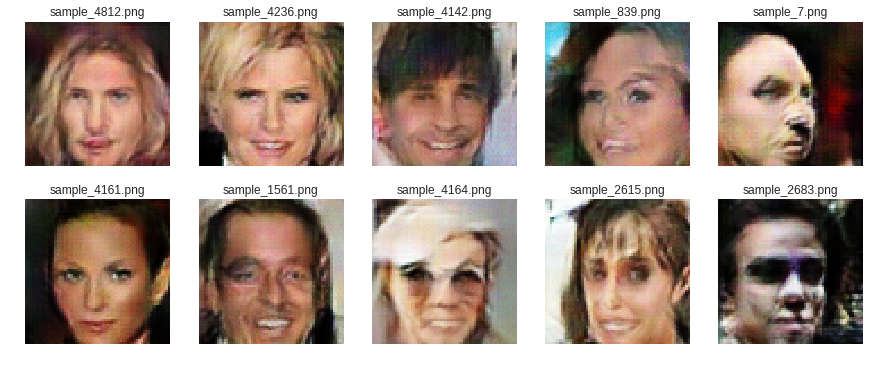

In [23]:
from os.path import join
def visualize(data_path, n_cols=5, n_rows=1):
    plt.figure(figsize = (3*n_cols,3*n_rows))
    for n, filename in enumerate(np.random.choice(os.listdir(data_path), size = n_cols*n_rows)):
        plt.subplot(n_rows,n_cols,n+1)
        plt.axis('off')
        img = plt.imread(join(data_path, filename))
        plt.imshow(img)
        plt.title(filename)
    plt.show()
visualize(new_samples_dir, n_cols=5, n_rows=2)

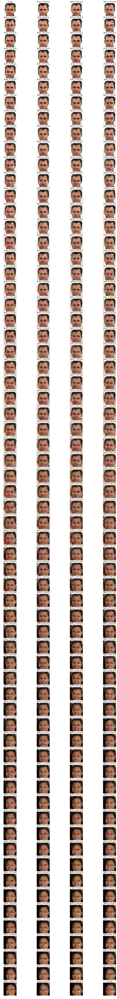

In [54]:
z_list = np.random.uniform(-1, 1, [2, Z_DIM]).astype(np.float32)
alpha_list = np.linspace(0, 1, BATCH_SIZE)
batchz = np.zeros((BATCH_SIZE, Z_DIM))
for i, alpha in enumerate(alpha_list):
    batchz[i] = alpha*z_list[0] + (1 - alpha)*z_list[1]
samples = sess.run(G, feed_dict={z: batchz, is_training: False})
interpolation_dir = 'face_interpolation'
names = []
for i, sample in enumerate(samples):
    if i == 0:
        filename = 'z2.png'
        names.append(filename)
    elif i == len(samples) - 1:
        filename = 'z1.png'
        names.append(filename)
    else:
        filename = 'alpha_' + str(round(alpha_list[i], 3)) + '.png'
        if i&1 == 0 and i != len(samples) - 2:
            names.append(filename)
    plt.imsave(os.path.join(interpolation_dir, filename), (255*inverse_transform(sample)).astype(np.uint8))
plt.figure(figsize=(16, 128))
for i, name in enumerate(names):
    plt.subplot(64, 4, i+1)
    plt.axis('off')
    img = plt.imread(join(interpolation_dir, name))
    plt.imshow(img)
    plt.title(name)
plt.show()

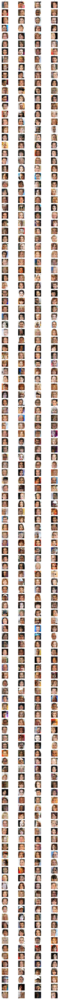

In [58]:
batchz = np.random.uniform(-1, 1, [BATCH_SIZE, Z_DIM]).astype(np.float32)
samples = sess.run(G, feed_dict={z: batchz, is_training: False})
plt.figure(figsize=(16, 256))
for i, sample in enumerate(samples):
    plt.subplot(128, 4, i+1)
    plt.axis('off')
    plt.title(str(i))
    plt.imshow((255*inverse_transform(sample)).astype(np.uint8))
plt.show()

In [0]:
no_smiles = [33, 35, 28, 24, 25, 21, 19, 16, 15, 10, 6, 47, 54, 59, 100, 106]
smiles = [50, 63, 66, 64, 71, 84, 88, 97, 105, 118, 126, 143, 151, 155, 181]
smile_mean = batchz[with_smiles].mean(axis=0)
no_smile_mean = batchz[without_smiles].mean(axis=0)

smile_vector = smile_mean - no_smile_mean

add_smile = batchz + smile_vector
add_smile = add_smile.clip(-1, 1)
add_smile_samples = sess.run(G, feed_dict={z: add_smile, is_training: False})

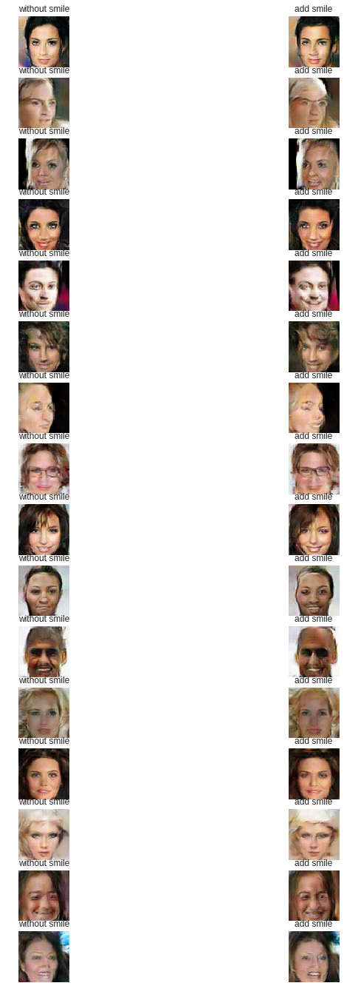

In [66]:
plt.figure(figsize = (12, 24))
for i, idx in enumerate(without_smiles):
    plt.subplot(len(without_smiles), 2, i*2+1)
    plt.axis('off')
    plt.title("without smile")
    plt.imshow((255*inverse_transform(samples[idx])).astype(np.uint8))
    plt.subplot(len(without_smiles), 2, i*2+2)
    plt.axis('off')
    plt.title("add smile")
    plt.imshow((255*inverse_transform(add_smile_samples[idx])).astype(np.uint8))
plt.show()